# Skin Cancer Detection and Classification with Deep Learning

#### CAPSTONE PROJECT for Applied Data Science and Machine Learning Course   
#### Pawel Rosikiewicz   
#### prosikiewicz@gmail.com

In [1]:
# *********************************************************** #
#                                                             #
#    Copyrights:                                              # ivbju
#                                                             #
#    IT IS NOT ALLOWED TO COPY, DISTRIBUTE                    # 
#    in any form of these files, scripts, methods,            # 
#    data and results without written persmission             #
#    of the Author                                            #
#                                                             #
#    Author: Pawel Rosikiewicz                                #
#    Contact: prosikiewicz_gmail.com                          #
#                                                             #
# *********************************************************** #

# standard imports

In [1]:
import os # allow changing, and navigating files and folders, 
import shutil
import sys
import re # module to use regular expressions, 
import glob # lists names in folders that match Unix shell patterns
import random # functions that use and generate random numbers

import pickle
import warnings
import numpy as np # support for multi-dimensional arrays and matrices
import pandas as pd # library for data manipulation and analysis
import seaborn as sns # advance plots, for statistics, 
import matplotlib as mpl # to get some basif functions, heping with plot mnaking 
import matplotlib.pyplot as plt # for making plots, 

from PIL import Image, ImageDraw
from IPython.display import display
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import ParameterGrid
from sklearn.model_selection import train_test_split
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import ParameterGrid
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import scale
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf # tf.__version__ 
import tensorflow.keras as keras 
import matplotlib.pyplot as plt # for making plots, 
import scipy.stats as stats  # library for statistics and technical programming, 
import scipy.cluster.hierarchy as sch
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from IPython.display import display
from tensorflow.keras import backend as K # used for housekeeping of tf models,
from sklearn.metrics import accuracy_score
from sklearn.utils import class_weight
# To avoid restaring the kernel with keras, preffered solution; use conda install nomkl
os.environ['KMP_DUPLICATE_LIB_OK']='True'

# setup basedir & load project/task imports

In [2]:
# setup basedir
basedir = os.path.dirname(os.getcwd())
os.chdir(basedir)
sys.path.append(basedir)

# caution, loaded only form basedir,
import src.utils.EDA_Helpers2 as eda_helpers 
from src.utils.example_plots import *
from src.utils.feature_extraction_tools import encode_images_with_tfhubmodule # with tf.compat.v1 functions, for tf.__version___ >= 1.15
from src.utils.clustered_histogram import find_n_examples_in_each_class, clustered_histogram_with_image_examples, calculate_linkage_for_images_with_extracted_features
from src.utils.clustered_histogram import add_descriptive_notes_to_each_cluster_in_batch_labels, find_clusters_on_dendrogram, create_clustered_heatmap_with_img_examples
from src.utils.data_loaders import load_encoded_imgbatch_using_logfile, load_raw_img_batch
from src.utils.example_plots_after_clustering import plot_img_examples, create_spaces_between_img_clusters, plot_img_examples_from_dendrogram
from src.utils.feature_extraction_tools import encode_images
from src.utils.data_loaders import load_encoded_imgbatch_using_logfile, load_raw_img_batch
from src.utils.example_plots_after_clustering import plot_img_examples, create_spaces_between_img_clusters, plot_img_examples_from_dendrogram
from src.utils.annotated_pie_charts import annotated_pie_chart_with_class_and_group, prepare_img_classname_and_groupname
from src.utils.tools_for_plots import create_class_colors_dict
from src.utils.logreg_tools import my_logredCV, plot_examples_with_predictions_and_proba, plot_examples_with_predictions_and_proba_gamma
from src.utils.random_forest import random_forest_grid_search, plot_random_tree_summary_andor_table
from src.utils.SVM_tools import SVM_grid_search, plot_grid_acc_and_return_summary_df
from src.utils.tools_for_plots import create_class_colors_dict
from src.utils.model_summary_plots import plot_grid_acc_and_return_summary_df, visual_model_summary, model_gridsearch_summary_plots
from src.utils.knn_tools import knn_grid_search
from src.utils.image_augmentation import *
from src.utils.annotated_pie_charts import annotated_pie_chart_with_class_and_group, prepare_img_classname_and_groupname
from src.utils.tools_for_plots import create_class_colors_dict
from src.utils.pca_tools import pca_analyis_with_plots, pca_scree_plots, pca_pve_vs_variance_scatterplots
from src.utils.new_data_loaders import find_different_filetypes
from src.utils.sklearn_models_tools import sklearn_grid_search
from src.utils.method_comparison_tools import boxplot_with_acc_from_different_models
from src.utils.method_comparison_tools import method_comparison_boxplot
from src.utils.cnn_transfer_learning_tools import CNN_GridSearch, create_keras_two_layer_dense_model, plot_NN_loss_acc
warnings.filterwarnings("ignore")

# configs

In [12]:
# load project configs
from src.configs.project_configs import PROJECT_NAME
from src.configs.project_configs import CLASS_DESCRIPTION # information on each class, including descriptive class name and diegnostic description - used to help wiht the project
from src.configs.tfhub_configs import TFHUB_MODELS # names of TF hub modules that I presenlected for featuress extraction with all relevant info,
from src.configs.dataset_configs import DATASET_CONFIGS # names created for clases, assigned to original one, and colors assigned to these classes
from src.configs.dataset_configs import CLASS_LABELS_CONFIGS # names created for clases, assigned to original one, and colors assigned to these classes
from src.configs.dataset_configs import DROPOUT_VALUE # str, special value to indicate samples to remoce in class labels
from src.configs.config_functions import CONFIG_FUNCTION_define_datasets # function that creates datasunbsets collections for one dataset (custome made for that project)

# set task configs, ........................................................................  
TASK_NAME                  = "SUMMARY_models_comparison"
DATASET_NAME               = "HAM10000" # dataset name, 
DATASET_VARIANTS           = DATASET_CONFIGS[DATASET_NAME]["labels"] # labels that will be added here
MODULE_NAMES               = [TFHUB_MODELS[x]['module_name'] for x in list(TFHUB_MODELS.keys())]

# set run configs, ........................................................................   
METHOD_NAME_LIST           = ["knn", "random_forest", "svm", "cnn_transfer_learning", "deNovoCNN",
                              "knn_balanced", "random_forest_balanced", "cnn_transfer_learning_balanced"]
METHOD_GROUPS              = ["sklearn_model", "sklearn_model", "sklearn_model", "cnn", "cnn"]
DATASET_LIST                    = ["HAM10000", "HAM10000", "HAM10000", "HAM10000", "HAM10000",
                              "HAM10000_balanced", "HAM10000_balanced", "HAM10000_balanced"]
BATCH_COLLECTION_NAMES     = {"HAM10000": { "boxpot":["parameter_selection", 'cnn_all_data'],
                                            "scatter":["best_models_with_all_data", "full_models"]
                              }}

# set up paths for the task and define datasets collections

In [4]:
PATH_raw = os.path.join(basedir, "data/raw", DATASET_NAME)
PATH_interim = os.path.join(basedir, "data/interim")
PATH_models = os.path.join(basedir, "models")
PATH_interim_dataset_summary_tables = os.path.join(PATH_interim, "dataset_summary_tables")
PATH_extracted_features = os.path.join(PATH_interim, f"{DATASET_NAME}_extracted_features")
PATH_additional_class_labels = os.path.join(PATH_extracted_features, "additional_class_labels")
PATH_data_results = os.path.join(basedir, "data/results")

# create path to store results, ............................................................
PATH_results = os.path.join(PATH_data_results, f"{DATASET_NAME}_{TASK_NAME}")


# build summary table with results from all methods, varinats and models, 

In [116]:
os.chdir(PATH_data_results)
counter = -1
for i, (one_method_name, DATASET_NAME) in enumerate(zip(METHOD_NAME_LIST, DATASET_LIST)):
    
    # go to directory, 
    methods_results_path = os.path.join(PATH_data_results,f"{DATASET_NAME}_{one_method_name}")
    os.chdir(methods_results_path)

    # catalog all files inside 
    file_list = []
    for file in glob.glob("*__summary_table.csv"):
        file_list.append(file)
    
    # info
    print("\n", i, one_method_name, ": ",len(file_list), " files witll be added...\n")
        
    # load and concatenate all of them
    for file_name in file_list:
        counter+=1
        
        # .. load summary_df, and add filename and path
        one_module_summary_df                              = pd.read_csv(file_name)
        one_module_summary_df["summary_table__file_name"]  = file_name
        one_module_summary_df["summary_table__path"]       = methods_results_path
        one_module_summary_df[one_method_name]             = one_method_name
        
        # ... concatenate
        if counter==0:
            summary_df = one_module_summary_df 
        else:
            summary_df = pd.concat([summary_df,one_module_summary_df], axis=0)    
        
        # ... info
        # print(f"- {counter} - {file_name} - {summary_df.shape}")    
summary_df.reset_index(drop=True, inplace=True)
print(summary_df.shape)


 0 knn :  60  files witll be added...


 1 random_forest :  60  files witll be added...


 2 svm :  31  files witll be added...


 3 cnn_transfer_learning :  24  files witll be added...


 4 deNovoCNN :  12  files witll be added...


 5 knn_balanced :  60  files witll be added...


 6 random_forest_balanced :  60  files witll be added...


 7 cnn_transfer_learning_balanced :  20  files witll be added...

(5027, 67)


In [126]:
# CUSTOM CLEANING
problematic_columns = ['validation_split'] # with no usefull data, typically infherrited from params, 
for pc in problematic_columns:
    try:
        summary_df = summary_df.drop('validation_split', axis=1)
    except:
        print(pc, " - not found")
summary_df.shape

print(summary_df.shape)
# in one of my fucntions, baseline was a smallest proportion, 
# it is being corrected here (I checked it by hand in excel using batch labels)
baseline_missing = summary_df.summary_table__file_name.str.contains("deNovoCNN")
one_different_dataset_variant = summary_df.summary_table__file_name.str.contains("Cancer_Classification")

# .. now replace
summary_df.baseline_acc_valid.loc[baseline_missing] = 0.372  # its balanced,
summary_df.baseline_acc_test.loc[baseline_missing] = 0.628  # these are same as inbalanced datasets, 
summary_df.baseline_acc_test_2.loc[baseline_missing] = 0.617
# ....
summary_df.baseline_acc_valid.loc[baseline_missing & one_different_dataset_variant] = 0.336
summary_df.baseline_acc_test.loc[baseline_missing & one_different_dataset_variant] = 0.351
summary_df.baseline_acc_test_2.loc[baseline_missing & one_different_dataset_variant] = 0.348

# .. remove results for unit_test that accidentally were placed int hat datset
print(summary_df.shape)
summary_df = summary_df.drop(np.where(summary_df.summary_table__file_name.str.contains("unit_test")==True)[0], axis=0)# axis = 1 , drop row
print(summary_df.shape)


# add balanced to dataset_variant
summary_df["balanced_dataset"] = False
balanced_pos = summary_df.summary_table__file_name.str.contains("balanced")
print(balanced_pos.sum())
summary_df.loc[balanced_pos, "balanced_dataset"] = True
balanced_pos = summary_df.summary_table__file_name.str.contains("deNovoCNN")
print(balanced_pos.sum())
summary_df.loc[balanced_pos, "balanced_dataset"] = True
print(summary_df.shape)

# replcae one of the names iof dataset - currently I have two synonimes, and I wish to habejust one name for balanced datset
#     -  before chnage - array(['HAM10000', 'HAM10000__deNovoCNN_balanced', 'HAM10000_balanced'],
pos_s = summary_df.dataset_name=='HAM10000__deNovoCNN_balanced'
summary_df.loc[pos_s, "dataset_name"]='HAM10000_balanced'




# create new column wthat will be used to build groups for boxplots
summary_df["balanced_dataset_str"] = "no"
summary_df.loc[summary_df.balanced_dataset==True, "balanced_dataset_str"]="yes"



# add column with method_group, 
summary_df["method_name"] = [f"{x}, {y} ({z})" for (x,y, z) in zip(
                                 summary_df.loc[:,"method"].values.tolist(),
                                 summary_df.loc[:, "method_variant"].values.tolist(),
                                 summary_df.loc[:, "module"].values.tolist(),
                                 )]
summary_df["method_full_name"] = [f"{x}__{y}__{z}__{zz}__{zzz}" for (x,y,z,zz, zzz) in zip(
        summary_df.loc[:,"method"].values.tolist(),
        summary_df.loc[:, "method_variant"].values.tolist(),
        summary_df.loc[:, "module"].values.tolist(),
        summary_df.loc[:, "dataset_variant"].values.tolist(),    
        summary_df.loc[:, "balanced_dataset_str"].values.tolist() 
    )]





validation_split  - not found
(5026, 70)
(5026, 70)
(5026, 70)
2371
11
(5026, 70)


# Grid Search on parameters

# Evaluate the results
---

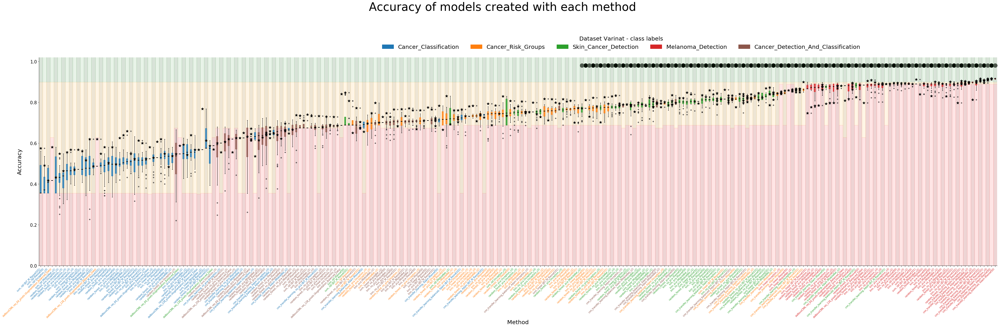

In [122]:
new_method_comparison_boxplot(                          
    title=f"Accuracy of models created with each method\n", 
    data = summary_df,#.iloc[0:500,:],#.iloc[0:500,:]         # pd.DataFrame with the results,   
    figsize=(60,15),
    # ...
    col_with_baseline      ="baseline_acc_test",
    col_with_results       ="model_acc_test",       # df colname with values to display, eg: test_accuracy ...
    col_with_group_names   ="method_name",          # df colname with values that will be displayed as names of each box (these do not have to be unique)
    col_with_group_ID      ="method_full_name",      # df colname with values that will be grouped for separate boxes (must be unieque)
    col_with_group_colors  ="dataset_variant",       # df colname with values that will have different colors (colors can not be mixed within diffeent group_ID)
    col_with_pattern       ="summary_table__file_name", # collumn that holds fule file name or its elements that indicated that a given results were made with full data or partial data
    full_data_pattern_list = ["best_models_with_all_data", "full_models", 'cnn_all_data', "deNovoCNN", "cnn_transfer_learning"],  
    additional_group       = "balanced_dataset",      # bool, position for marker on top of the figure, 
                                # pattern in file name that will be used to udentify models create wiht full datasets, these will be pèlotted as scatterplots
    # ... colors
    cmap="tab10",
    cmap_colors_from=0,
    cmap_colors_to=0.5,                               
    
    # .. legend
    legend_title="Dataset Varinat - class labels",
    legend__bbox_to_anchor=(0.7, 0.96),
    subplots_adjust_top = 0.8,
    legend_ncols=5,
    
    # .. baseline
    baseline_title = "",
    baseline_loc =-0.09,
    use_fixed_baselines = False,
    baseline_limit_list = [0.5, 0.9, 1.5], # the last one 
    baseline_color_list = ["red", "orange", "forestgreen"],
    
    # ... fontsizes
    title_fontsize=40,
    legend_fontsize=20,
    xticks_fontsize=8,
    yticks_fontsize=15,
    axes_labels_fontsize=20,
    
    # ... axies labels
    xaxis_label = "Method",
    yaxis_label = "Accuracy\n",
    paint_xticks=True,
    # ... scatterpoints for full models,
    add_full_models_markers =True, # if False, they are oging to be part of the barplots
    full_model_marker ="*",
    full_model_markersize=80,
    full_model_markercolor="black"
)

In [127]:
summary_df.dataset_name.unique()

array(['HAM10000', 'HAM10000_balanced'], dtype=object)

In [151]:
for dataset_variant in DATASET_VARIANTS:

    
    # V1 - module + dataset type
    
    # create subset
    cmap_colors_to = 1
    sub_summary_df = summary_df.loc[summary_df.dataset_variant==dataset_variant,:]

    # subset_group_names for different box colors, 
    sub_summary_df["sub_group_name"] = [f"{x}, {y}" for (x, y) in zip( sub_summary_df.loc[:, "module"].values.tolist(),
                                  sub_summary_df.loc[:,"dataset_name"].values.tolist(),
                                 )]
    
    
    
    # -------------------------------------------------------------------------
    # V2 - just a datase type, modules are in one group in each method
    # create subset
    cmap_colors_to = 0.5
    sub_summary_df = summary_df.loc[summary_df.dataset_variant==dataset_variant,:]

    # subset_group_names for different box colors, 
    sub_summary_df["sub_group_name"] = [f"{y}" for (x, y) in zip( sub_summary_df.loc[:, "module"].values.tolist(),
                                  sub_summary_df.loc[:,"dataset_name"].values.tolist(),
                                 )]    
    
    sub_summary_df["method_full_name"] = [f"{x}__{y}__{zz}__{zzz}__{dsn}" for (x,y,z,zz, zzz, dsn) in zip(
            sub_summary_df.loc[:,"method"].values.tolist(),
            sub_summary_df.loc[:, "method_variant"].values.tolist(),
            sub_summary_df.loc[:, "module"].values.tolist(),
            sub_summary_df.loc[:, "dataset_variant"].values.tolist(),    
            sub_summary_df.loc[:, "balanced_dataset_str"].values.tolist(),
            sub_summary_df.loc[:, "dataset_name"].values.tolist(),
    
        )]

    
    new_method_comparison_boxplot(                          
        title=f"Accuracy: {dataset_variant}", 
        data = sub_summary_df,#.iloc[0:500,:],#.iloc[0:500,:]         # pd.DataFrame with the results,   
        figsize=(25,8),
        # ...
        col_with_baseline      ="baseline_acc_test",
        col_with_results       ="model_acc_test",       # df colname with values to display, eg: test_accuracy ...
        col_with_group_names   ="method_name",          # df colname with values that will be displayed as names of each box (these do not have to be unique)
        col_with_group_ID      ="method_full_name",      # df colname with values that will be grouped for separate boxes (must be unieque)
        col_with_group_colors  ="sub_group_name",       # df colname with values that will have different colors (colors can not be mixed within diffeent group_ID)
        col_with_pattern       ="summary_table__file_name", # collumn that holds fule file name or its elements that indicated that a given results were made with full data or partial data
        full_data_pattern_list = ["best_models_with_all_data", "full_models", 'cnn_all_data', "deNovoCNN", "cnn_transfer_learning"],  
        additional_group       = "balanced_dataset",      # bool, position for marker on top of the figure, 
                                    # pattern in file name that will be used to udentify models create wiht full datasets, these will be pèlotted as scatterplots
        # ... colors
        cmap="tab10",
        cmap_colors_from=0,
        cmap_colors_to=cmap_colors_to,                               

        # .. legend
        legend_title="",
        legend__bbox_to_anchor=(0.85, 1.1),
        subplots_adjust_top = 0.7,
        legend_ncols=4,

        # .. baseline
        baseline_title = "",
        baseline_loc =-0.09,
        use_fixed_baselines = False,
        baseline_limit_list = [0.5, 0.9, 1.5], # the last one 
        baseline_color_list = ["red", "orange", "forestgreen"],

        # ... fontsizes
        title_fontsize=40,
        legend_fontsize=15,
        xticks_fontsize=8,
        yticks_fontsize=15,
        axes_labels_fontsize=20,

        # ... axies labels
        xaxis_label = "Method",
        yaxis_label = "Accuracy\n",
        paint_xticks=True,
        # ... scatterpoints for full models,
        add_full_models_markers =True, # if False, they are oging to be part of the barplots
        full_model_marker ="*",
        full_model_markersize=80,
        full_model_markercolor="black",
        verbose=True
    )
    plt.show();

knn__pca__Cancer_Detection_And_Classification__no__HAM10000 contains more then one group to display wiht different names !
knn__no_pca__Cancer_Detection_And_Classification__no__HAM10000 contains more then one group to display wiht different names !
random_forest__pca__Cancer_Detection_And_Classification__no__HAM10000 contains more then one group to display wiht different names !
random_forest__no_pca__Cancer_Detection_And_Classification__no__HAM10000 contains more then one group to display wiht different names !
svm__rbf__Cancer_Detection_And_Classification__no__HAM10000 contains more then one group to display wiht different names !
svm__linear__Cancer_Detection_And_Classification__no__HAM10000 contains more then one group to display wiht different names !
cnn_transfer_learning__Adam__Cancer_Detection_And_Classification__no__HAM10000 contains more then one group to display wiht different names !
knn__no_pca__Cancer_Detection_And_Classification__yes__HAM10000_balanced contains more then

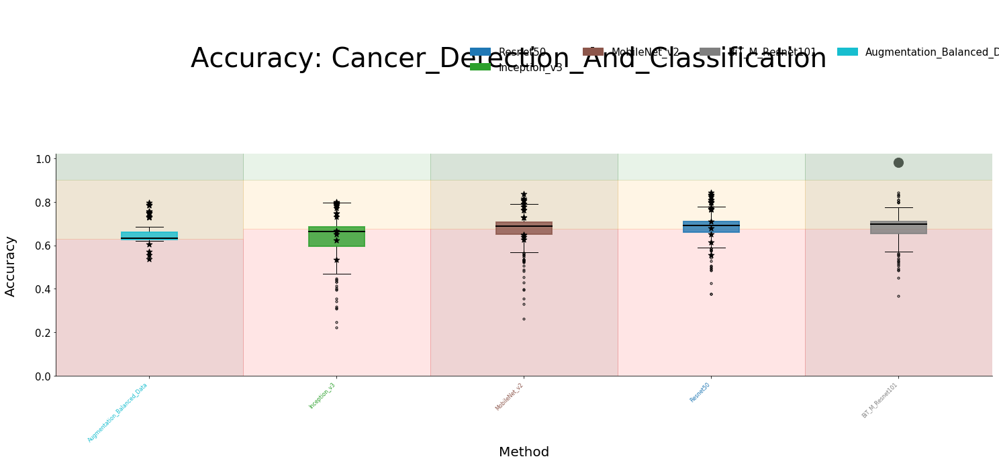

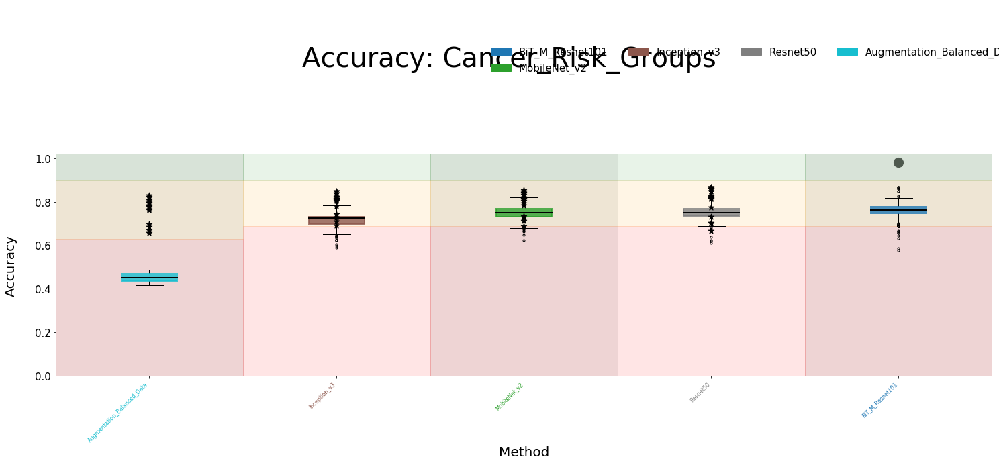

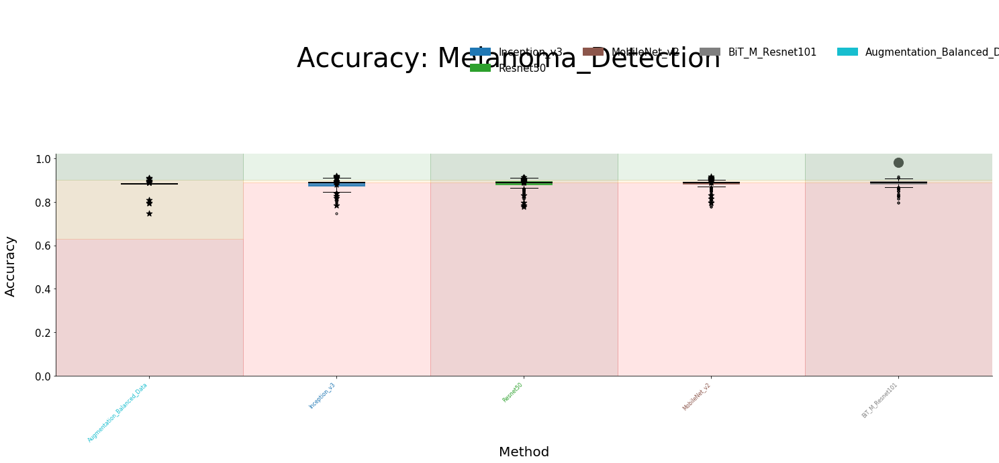

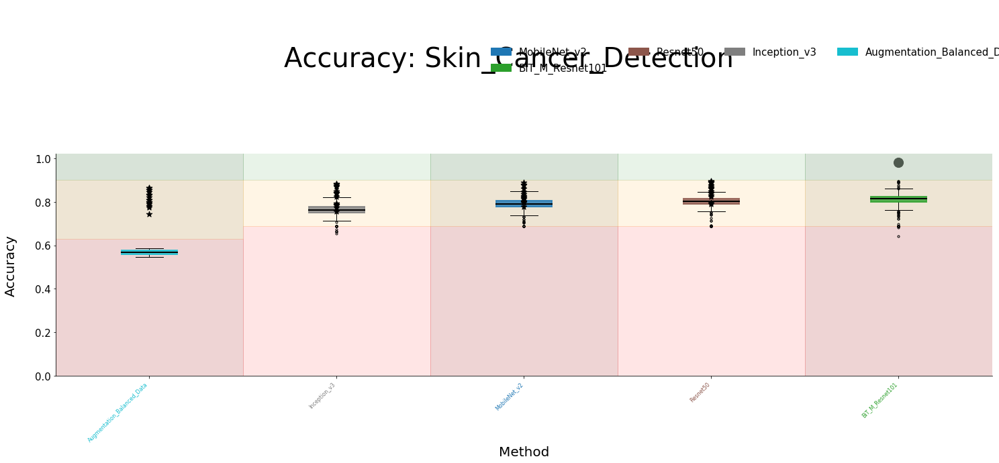

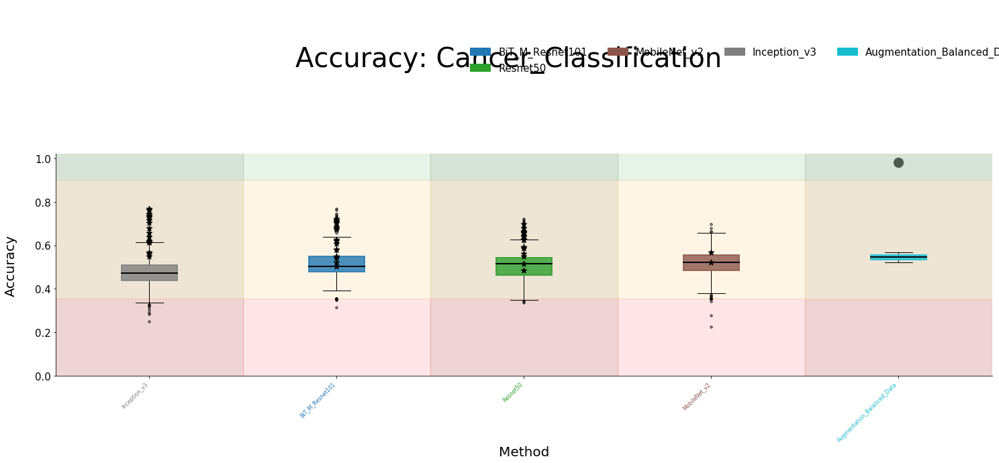

In [152]:
for dataset_variant in DATASET_VARIANTS:

    
    # V1 - module + dataset type
    
    # create subset
    cmap_colors_to = 1
    sub_summary_df = summary_df.loc[summary_df.dataset_variant==dataset_variant,:]

    
    new_method_comparison_boxplot(                          
        title=f"Accuracy: {dataset_variant}", 
        data = sub_summary_df,#.iloc[0:500,:],#.iloc[0:500,:]         # pd.DataFrame with the results,   
        figsize=(25,8),
        # ...
        col_with_baseline      ="baseline_acc_test",
        col_with_results       ="model_acc_test",       # df colname with values to display, eg: test_accuracy ...
        col_with_group_names   ="module",          # df colname with values that will be displayed as names of each box (these do not have to be unique)
        col_with_group_ID      ="module",      # df colname with values that will be grouped for separate boxes (must be unieque)
        col_with_group_colors  ="module",       # df colname with values that will have different colors (colors can not be mixed within diffeent group_ID)
        col_with_pattern       ="summary_table__file_name", # collumn that holds fule file name or its elements that indicated that a given results were made with full data or partial data
        full_data_pattern_list = ["best_models_with_all_data", "full_models", 'cnn_all_data', "deNovoCNN", "cnn_transfer_learning"],  
        additional_group       = "balanced_dataset",      # bool, position for marker on top of the figure, 
                                    # pattern in file name that will be used to udentify models create wiht full datasets, these will be pèlotted as scatterplots
        # ... colors
        cmap="tab10",
        cmap_colors_from=0,
        cmap_colors_to=cmap_colors_to,                               

        # .. legend
        legend_title="",
        legend__bbox_to_anchor=(0.85, 1.1),
        subplots_adjust_top = 0.7,
        legend_ncols=4,

        # .. baseline
        baseline_title = "",
        baseline_loc =-0.09,
        use_fixed_baselines = False,
        baseline_limit_list = [0.5, 0.9, 1.5], # the last one 
        baseline_color_list = ["red", "orange", "forestgreen"],

        # ... fontsizes
        title_fontsize=40,
        legend_fontsize=15,
        xticks_fontsize=8,
        yticks_fontsize=15,
        axes_labels_fontsize=20,

        # ... axies labels
        xaxis_label = "Method",
        yaxis_label = "Accuracy\n",
        paint_xticks=True,
        # ... scatterpoints for full models,
        add_full_models_markers =True, # if False, they are oging to be part of the barplots
        full_model_marker ="*",
        full_model_markersize=80,
        full_model_markercolor="black",
        verbose=True
    )
    plt.show();

In [143]:

def new_method_comparison_boxplot(*,                               
    title=f"Accuracy of models created with each method\n",
    data,  
    figsize=(45,15),
    # ...
    col_with_baseline,
    col_with_results,# df colname with values to display, eg: test_accuracy ...
    col_with_group_names,# df colname with values that will be displayed as names of each box (these do not have to be unique)
    col_with_group_ID,# df colname with values that will be grouped for separate boxes (must be unieque)
    col_with_group_colors,# df colname with values that will have different colors (colors can not be mixed within diffeent group_ID)
    col_with_pattern,# collumn that holds fule file name or its elements that indicated that a given results were made with full data or partial data
    full_data_pattern_list, # pattern in file name that will be used to udentify models create wiht full datasets, these will be pèlotted as scatterplots
    additional_group = None, # bool, position for marker on top of the figure, 
    # ... colors
    cmap="tab10",
    cmap_colors_from=0,
    cmap_colors_to=0.5,                               
    
    # .. legend
    legend_title="Dataset Varinat - class labels",
    legend__bbox_to_anchor=(0.7, 0.99),
    subplots_adjust_top = 0.8,
    legend_ncols=5,
    
    # .. baseline
    baseline_title = "",
    baseline_loc =-0.09,
    use_fixed_baselines = False,
    baseline_limit_list = [0.5, 0.9, 1.5], # the last one 
    baseline_color_list = ["red", "orange", "forestgreen"],
    
    # ... fontsizes
    title_fontsize=40,
    legend_fontsize=20,
    xticks_fontsize=8,
    yticks_fontsize=15,
    axes_labels_fontsize=20,
    
    # ... axies labels
    xaxis_label = "Method",
    yaxis_label = "Accuracy\n",
    paint_xticks=True,
    # ... scatterpoints for full models,
    add_full_models_markers =True, # if False, they are oging to be part of the barplots
    full_model_marker ="*",
    full_model_markersize=80,
    full_model_markercolor="black",
    verbose=False
):


    """
        Nice function to create ngs-like boxplots for comparison of acc of differemnt model groups
        it is more generic version of the abofe function, 
    """

    
    # ...............................................
    # managment
    Stop_Function = False
    
    # ...............................................
    # data preparation - step.1 extraction
    # ...............................................

    # - extract unique values that will be searched, 
    unique_group_ID               = data.loc[:,col_with_group_ID].unique().tolist()
    unique_group_color_names      = data.loc[:,col_with_group_colors].unique().tolist()
    
    # - map colors onto color_groups_names
    bx_color_dict = create_class_colors_dict(
        list_of_unique_names=unique_group_color_names, 
        cmap_name=cmap, 
        cmap_colors_from=cmap_colors_from, 
        cmap_colors_to=cmap_colors_to
    )   
    
    # - lists with data for boxes, 
    'one item for one box in each'
    bx_data             = [] 
    bx_baseline         = []
    bx_names            = []
    bx_colors           = []
    bx_id               = []
    bx_colors_dict_key  = []
    bx_full_models      = []
    bx_additional_group = []
    
    # - separate all boxes, and then find out what is the color and data associated with that box
    for one_group_ID in unique_group_ID:
        bx_id.append(one_group_ID)
        
        
        #### values
        
        # .. get the data and other columns for one box
        data_df_for_one_box = data.loc[data.loc[:, col_with_group_ID]==one_group_ID,:]
        
        # .. find baseline
        bx_baseline.append(data_df_for_one_box.loc[:, col_with_baseline].max())
        
        # .. find out, data, name and color to display
        # .... num. data ....
        bx_data.append(data_df_for_one_box.loc[:,col_with_results].values) # np.array
        
        # .. find additional group (bool value)
        if additional_group!=None:
            bx_additional_group.append(data_df_for_one_box.loc[:, additional_group].iloc[0])
        else:
            bx_additional_group.append(False) # ie no marker will be displayed on any group
    
        # .. scatterpoints with the top performing models
        for p_i, pat in enumerate(full_data_pattern_list):
            arr_temp = data_df_for_one_box.summary_table__file_name.str.contains(pat).values
            if p_i==0:
                full_model_pos = arr_temp
            else:
                full_model_pos[arr_temp]=True 
        if full_model_pos.sum()==0:
            bx_full_models.append(data_df_for_one_box.loc[:,col_with_results].max()) 
            # here I will use only one value, full models were alwaasws having higher acc then the rest
        else:     
            bx_full_models.append(data_df_for_one_box.loc[full_model_pos.tolist(),col_with_results].values)     

            
        #### colors and labels, 
        
        # .... labels .....
        one_bx_label = data_df_for_one_box.loc[:,col_with_group_names].unique().tolist()
        if len(one_bx_label)==1:
            bx_names.append(one_bx_label[0]) # np.array
        else:
            if verbose==1:
                print(f"{one_group_ID} contains more then one group to display wiht different names !")
            else:
                Stop_Function = True
                pass
                
        # .... colors ....
        one_box_color = data_df_for_one_box.loc[:,col_with_group_colors].map(bx_color_dict).iloc[0]
        color_test_values = data_df_for_one_box.loc[:,col_with_group_colors].unique().tolist()
        if len(color_test_values)==1:
            bx_colors.append(one_box_color) # np.array
            bx_colors_dict_key.append(color_test_values[0])
        else:
            if verbose==1:
                print(f"{one_group_ID} contains more then one COLOR to display wiht different names !")
            else:
                Stop_Function = True
                pass        
        
    # - check if everythign is in order
    if len(bx_colors)!=len(bx_names) and len(bx_names)!=len(bx_data):
        if verbose==True:
            print("Error: some data are missing or belong to different gorups, and can not be displayed as coherent bocplot")
        else:
            pass
    else:
        

        # ...............................................
        # data preparation - step.2 ordering
        # ...............................................    

        # find memdians and reorder 
        bx_medians = list()
        for i, d in enumerate(bx_data):
            bx_medians.append(np.median(d))   
            

        # ...
        ordered_data_df = pd.DataFrame({
            "bx_data":    bx_data,
            "bx_medians": bx_medians,
            "bx_names":   bx_names,
            "bx_colors":  bx_colors,
            "bx_id":      bx_id,
            "bx_colors_dict_key":bx_colors_dict_key,
            "bx_baseline": bx_baseline,
            "bx_full_models":bx_full_models,
            "bx_additional_group":bx_additional_group
        })
        ordered_data_df = ordered_data_df.sort_values("bx_medians", ascending=True)
        ordered_data_df = ordered_data_df.reset_index(drop=True)


        # ...............................................
        # boxplot
        # ...............................................    
        
        # ...............................................
        # boxplot,  - plt.boxplot(ordered_bx_data);
        fig, ax = plt.subplots(figsize=figsize, facecolor="white")
        fig.suptitle(title, fontsize=title_fontsize)

        # add boxes,
        bx = ax.boxplot(ordered_data_df["bx_data"], 
                showfliers=True,                  # remove outliers, because we are interested in a general trend,
                vert=True,                        # boxes are vertical
                labels=ordered_data_df["bx_names"],           # x-ticks labels
                patch_artist=True,
                widths=0.3
        )
        
        if add_full_models_markers==True:
            for xpos in np.arange(ordered_data_df.shape[0]):
                ypos = ordered_data_df.bx_full_models.iloc[xpos]

                # this may be one or many values, 
                if isinstance(ypos, float):
                    ax.scatter(x=xpos, y=ypos ,color=full_model_markercolor, s=full_model_markersize,  marker=full_model_marker, zorder=100)
                else:
                    xposs = np.array([xpos]*ypos.shape[0])
                    ax.scatter(x=xposs, y=ypos ,color=full_model_markercolor, s=full_model_markersize,  marker=full_model_marker, zorder=100)
        else:
            pass
        
        ax.grid(ls=":", lw=0.001)
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        ax.set_xticklabels(ordered_data_df["bx_names"], rotation=45, fontsize=xticks_fontsize, ha="right")
        ax.set_yticks([0, .2, .4, .6, .8, 1])
        ax.set_yticklabels(["0.0", "0.2", "0.4", "0.6", "0.8", "1.0"], fontsize=yticks_fontsize)
        ax.set_ylabel(yaxis_label, fontsize=axes_labels_fontsize)
        ax.set_xlabel(xaxis_label, fontsize=axes_labels_fontsize)
        ax.set_ylim(0,1.02)

 
        # add colors to each box individually,
        for i, j in zip(range(len(bx['boxes'])),range(0, len(bx['caps']), 2)) :
            median_color  ="black"
            box_color     = bx_color_dict[ordered_data_df.loc[:,"bx_colors_dict_key"].iloc[i]]

            # set properties of items with the same number as boxes,
            plt.setp(bx['boxes'][i], color=box_color, facecolor=median_color, linewidth=2, alpha=0.8)
            plt.setp(bx["medians"][i], color=median_color, linewidth=2)
            plt.setp(bx["fliers"][i], markeredgecolor="black", marker=".") # outliers

            # set properties of items with the 2x number of features as boxes,
            plt.setp(bx['caps'][j], color=median_color)
            plt.setp(bx['caps'][j+1], color=median_color)
            plt.setp(bx['whiskers'][j], color=median_color)
            plt.setp(bx['whiskers'][j+1], color=median_color)

         
        # ...............................................
        # set colors for xtick labels,  
        
        if paint_xticks==True:
            for i, xtick in enumerate(ax.get_xticklabels()):
                xtick.set_color(bx_color_dict[ordered_data_df["bx_colors_dict_key"].iloc[i]])
        else:
            pass
            
            
            
        # ...............................................            
        # additional group - small marker to labels some large subtype of methods/data            
        
        for xpos, ag_bool in enumerate(bx_additional_group):
            if ag_bool==True:
                ax.scatter(y=0.98, x=xpos+1,marker="o", s=200, color="black")
            else:
                pass
            
            
            
        # ...............................................            
        # legend,    
        if ordered_data_df["bx_names"].shape[0]>0:

            # create patch for each dataclass, - adapted to even larger number of classes then selected for example images, 
            patch_list_for_legend =[]
            for i, m_name in enumerate(list(bx_color_dict.keys())):
                label_text = f"{m_name}"
                patch_list_for_legend.append(mpl.patches.Patch(color=bx_color_dict[m_name], label=label_text))

            # add patches to plot,
            leg = fig.legend(
                handles=patch_list_for_legend, frameon=False, title=legend_title,
                scatterpoints=1, ncol=legend_ncols, 
                bbox_to_anchor=legend__bbox_to_anchor, fontsize=legend_fontsize)
            plt.setp(leg.get_title(),fontsize=legend_fontsize)#'xx-small')
            
            # ...............................................
            # create space for the legend
            fig.subplots_adjust(top=subplots_adjust_top)    
            # ...............................................
            
            
        # ...............................................
        # color patches behing boxplots, 
        patch_width = 1   # ie. 1 = grey patch for 1 and 1 break
        patch_color = "lightgrey"
        pathces_starting_x = list(range(0, ordered_data_df.shape[0], patch_width*2))
        # ...
        for i, sx in enumerate(pathces_starting_x):
            rect = plt.Rectangle((sx+0.5, 0), patch_width, 1000, color=patch_color, alpha=0.4, edgecolor=None)
            ax.add_patch(rect)        


        # ...............................................
        # BASELINE color patches, 
        if use_fixed_baselines==False:
            for i, one_baseline in enumerate(ordered_data_df.bx_baseline.values.tolist()):
                # color patches for styling the accuracy, 
                rect = plt.Rectangle((i+0.5,0), width=1, height=one_baseline, color=baseline_color_list[0], alpha=0.1, edgecolor=None)
                ax.add_patch(rect)              
                rect = plt.Rectangle((i+0.5,one_baseline), width=1, height=baseline_limit_list[1]-one_baseline, color=baseline_color_list[1], alpha=0.1, edgecolor=None)
                ax.add_patch(rect)             
                rect = plt.Rectangle((i+0.5,baseline_limit_list[1]), width=1,  height=1000, color=baseline_color_list[2], alpha=0.1, edgecolor=None)
                ax.add_patch(rect) 

        else:       
            rect = plt.Rectangle((0,0), ordered_data_df.shape[0]*100, baseline_limit_list[0], color=baseline_color_list[0], alpha=0.1, edgecolor=None)
            ax.add_patch(rect)          
            rect = plt.Rectangle((0,baseline_limit_list[0]), ordered_data_df.shape[0]*100, baseline_limit_list[1]-baseline_limit_list[0], color=baseline_color_list[1], alpha=0.1, edgecolor=None)
            ax.add_patch(rect)             
            rect = plt.Rectangle((0,baseline_limit_list[1]), ordered_data_df.shape[0]*100, 1000, color=baseline_color_list[2], alpha=0.1, edgecolor=None)
            ax.add_patch(rect)               
            # ...............................................
            # add line with baseline
            ax.axhline(baseline_limit_list[0], lw=2, ls="--", color="dimgrey")
            ax.text(ordered_data_df.shape[0]+0.4, baseline_limit_list[0]+baseline_loc, baseline_title, ha="right", color="dimgrey", fontsize=yticks_fontsize)        
       
            

In [47]:
ypos

0.5741935483870968

# show best performing models in each group (sorted)

In [15]:
n_top_methods           = 1
sort_by                 = "model_acc_valid"
method_full_name_list   = summary_df.method_full_name.unique().tolist()

# collect top methods, 
for i, method_full_name in enumerate(method_full_name_list):
    
    # . subset summary_df
    summary_df_subset = summary_df.loc[summary_df.method_full_name==method_full_name, :]
    summary_df_subset = summary_df_subset.sort_values(sort_by, ascending=False)
    
    # . place in 
    if i==0:
        best_methods_summary_df = summary_df_subset.iloc[0:n_top_methods,:]
    else:
        best_methods_summary_df = pd.concat([best_methods_summary_df, summary_df_subset.iloc[0:n_top_methods,:]])
    best_methods_summary_df.reset_index(drop=True, inplace=True) 
    
# display examples:
# show best model examples
features_to_display = ["model_ID","dataset_variant", "module","method", "method_variant", 
                           "model_acc_train", "model_acc_valid", "model_acc_test", 
                           'n_estimators', 'max_depth', 'class_weight', "pca_components_used"]
sorted_best_methods_summary_df = best_methods_summary_df.sort_values("model_acc_valid", ascending=False)
sorted_best_methods_summary_df.reset_index(drop=True, inplace=True)
display(sorted_best_methods_summary_df.loc[:, features_to_display])

,model_ID,dataset_variant,module,method,method_variant,model_acc_train,model_acc_valid,model_acc_test,n_estimators,max_depth,class_weight,pca_components_used
0,3,Melanoma_Detection,MobileNet_v2,cnn_transfer_learning,Adam,0.918682,0.906814,0.899396,NaN,NaN,NaN,0
1,3,Melanoma_Detection,Resnet50,cnn_transfer_learning,Adam,0.913280,0.902138,0.915493,NaN,NaN,NaN,0
2,3,Melanoma_Detection,BiT_M_Resnet101,cnn_transfer_learning,Adam,0.907421,0.899800,0.905433,NaN,NaN,NaN,0
3,3,Melanoma_Detection,Inception_v3,cnn_transfer_learning,Adam,0.893418,0.895124,0.905433,NaN,NaN,NaN,0
4,3,Skin_Cancer_Detection,BiT_M_Resnet101,cnn_transfer_learning,Adam,0.891922,0.873413,0.893360,NaN,NaN,NaN,0
5,2,Skin_Cancer_Detection,MobileNet_v2,cnn_transfer_learning,Adam,0.888183,0.862057,0.879276,NaN,NaN,NaN,0
6,3,Skin_Cancer_Detection,Resnet50,cnn_transfer_learning,Adam,0.884734,0.859385,0.875252,NaN,NaN,NaN,0
7,3,Cancer_Risk_Groups,BiT_M_Resnet101,cnn_transfer_learning,Adam,0.862545,0.839011,0.865191,NaN,NaN,NaN,0
8,1,Skin_Cancer_Detection,Inception_v3,cnn_transfer_learning,Adam,0.833250,0.838009,0.853119,NaN,NaN,NaN,0
9,2,Cancer_Risk_Groups,MobileNet_v2,cnn_transfer_learning,Adam,0.849663,0.818303,0.839034,NaN,NaN,NaN,0


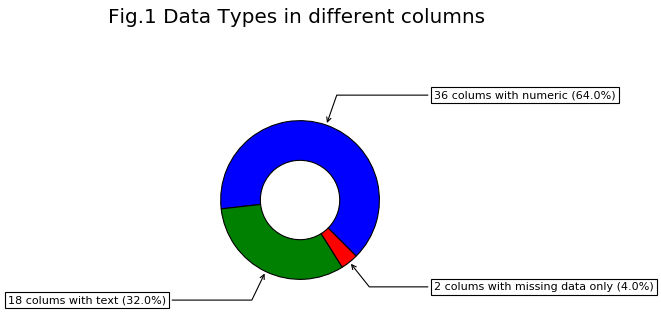

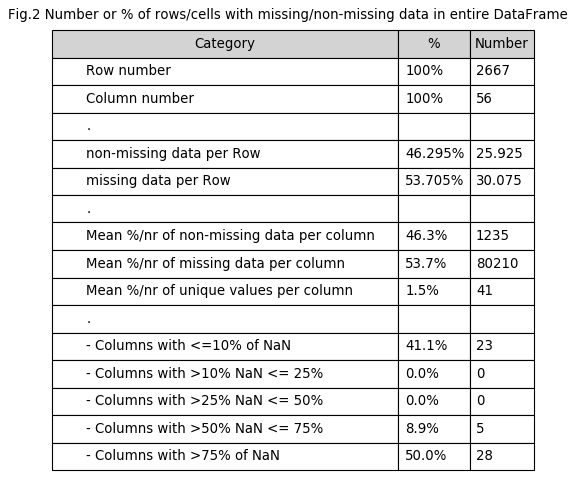

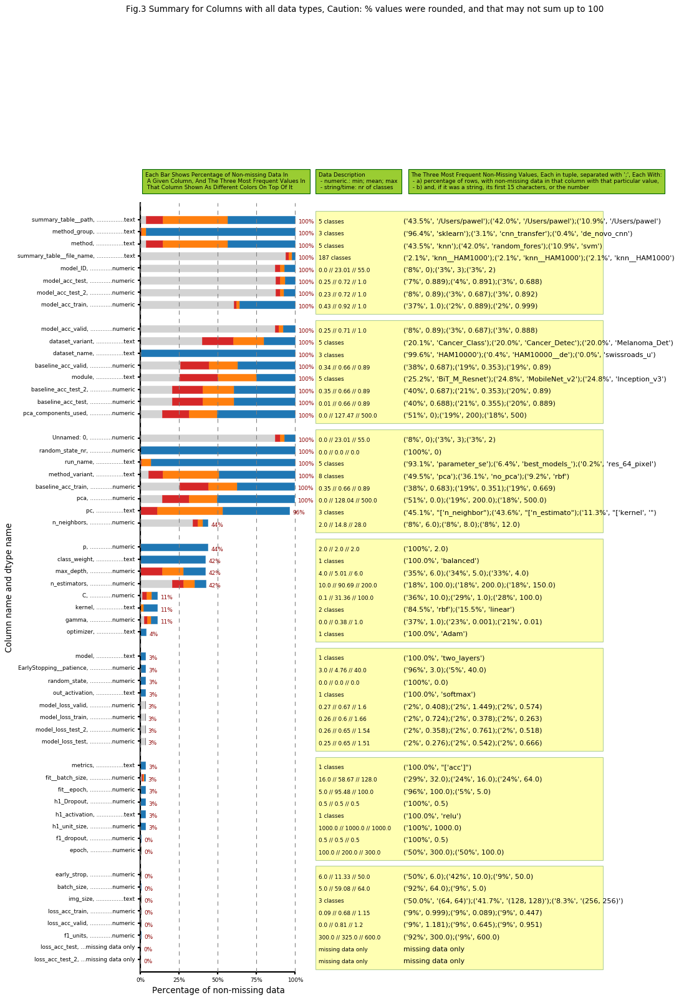

In [10]:
# summarize the table
# .. prepare the summary data for plots, these can be saves, but it is not nessesary (Function in Helpers)
data_examples, top_val_names, top_val_perc = eda_helpers.summarize_df(  df = summary_df.iloc[:,0:56], 
                                                            nr_of_examples_per_category = 3,
                                                            csv_file_name = None, 
                                                            save_dir = None,
                                                            verbose=False
                                                          )


# .. Plot all summary information on the data (Function in Helpers)
eda_helpers.examine_df_visually(
                    data_examples = data_examples, 
                    top_values_perc = top_val_perc, 
                    start_figure_numbers_at = 1, 
                    groups_to_display = "all",
                    pieChart =True, showTable =True, barPlot =True
                    )  # you may also use: groups_to_display = ['text', 'numeric', 'datetime'], and get barplots for each dtpye separately

# Show Predictions made with the best performing model for test data
---

* The best model was selected using validation accuracy, from all compared models in that section, 
* border colors arround each picture show true class of that image (see legend, for class-color pairs),
* the groups of images (labelled on top of each group), show classyfication made by the model,
* the probability values displayed on each image were calculated using model.predict_proba() function, 
* Predictions in each group were summarized, on pie plots below the main figure, 
* you may double click on the image to make it larger, 

Found 497 images belonging to 7 classes.


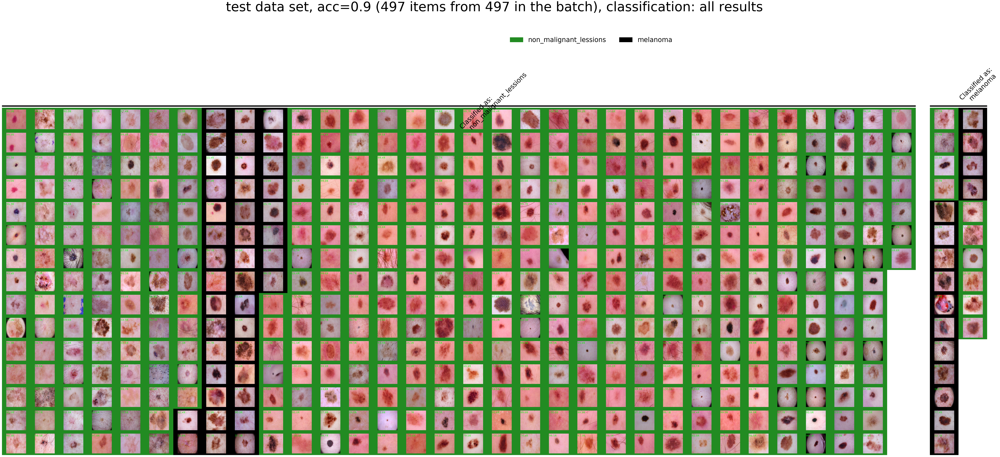

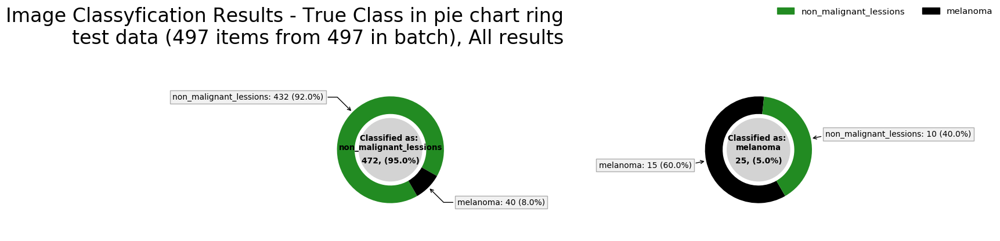

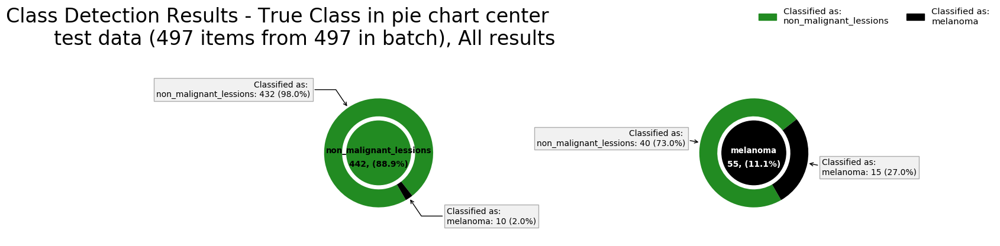

In [16]:
##########################################

idx_in_df = 0

##########################################


# find names, that will allow loading predictions for a given model,
raw_img_batch_name_toLoad     = "HAM10000_test_01"
path_to_ordered_images        = os.path.join(PATH_interim, DATASET_NAME)
task_name_toLoad              = TASK_NAME
# .................
dataset_name_toLoad           = sorted_best_methods_summary_df.dataset_name.iloc[idx_in_df]
dataset_variant_toLoad        = sorted_best_methods_summary_df.dataset_variant.iloc[idx_in_df]
module_toLoad                 = sorted_best_methods_summary_df.module.iloc[idx_in_df]
run_name_toLoad               = sorted_best_methods_summary_df.run_name.iloc[idx_in_df]
model_ID_toLoad               = sorted_best_methods_summary_df.model_ID.iloc[idx_in_df]
# .................   
file_name_fingerprint_toLoad  = f'{task_name_toLoad}__{dataset_name_toLoad}__{dataset_variant_toLoad }__{module_toLoad}__{run_name_toLoad}'
# ................. 
class_labels_colors_toUse     = CLASS_LABELS_CONFIGS[dataset_variant_toLoad]['class_labels_colors']



# Load predictions, 
os.chdir(PATH_results)
with open(f"{file_name_fingerprint_toLoad}__model_predictions_dict.p", 'rb') as file: 
    model_predictions_dict  = pickle.load(file)  
    
    
    

# create plots summarizing image classyfication in test and valid datasets
for dtype, subsets_used in zip(["test"], [raw_img_batch_name_toLoad]):
    acc = f'acc={np.round(df_sorted.loc[:, f"model_acc_{dtype}"].iloc[0],2)}'

    # display examples from best performing model,
    visual_model_summary( 
        model_predictions_dict  = model_predictions_dict, 
        model_ID                = model_ID_toLoad,    # applicable only with a given model_predictions_dict

        # ... to display, 
        n                       = "all", # use "all" to display all 
        examples_to_plot        = "all", # correct and incorrect on the same plot, 
        class_colors            = class_labels_colors_toUse,

        # ... sources, 
        dataset_name            = dataset_name_toLoad ,                              
        subset_name             = [dtype],           # name used in xy_names eg: train, valid, test test_2
        img_batch_subset_names  = [subsets_used], 
        path_to_raw_img_batch   = path_to_ordered_images,

        # ... settings for main plot, 
        title_prefix                 = f"{dtype} data set, {acc}",
        make_plot_with_img_examples  = True, # use False, to have only pie charts with classyfication summary                                         
        add_proba_values_to_img_name = True,
        max_img_per_col              = 15,

        # ... settings for annot. pie charts, 
        first_pie_title              =f"Image Classyfication Results - True Class in pie chart ring\n{dtype} data",
        second_pie_title             =f"Class Detection Results - True Class in pie chart center \n{dtype} data",
        pie_data_for_all_images_in_img_batch=True,
        pie_charts_in_ne_row         = 7,

        # ... pie chart aestetics added later to tune pie charts
        PIE_legend_loc = "upper right",
        PIE_ax_title_fonsize_scale=0.6,
        PIE_legend_fontsize_scale=1.4,
        PIE_wedges_fontsize_scale=1,
        PIE_legend_ncol=4,
        PIE_tight_lyout=False,
        PIE_title_ha="right",
        PIE_figsze_scale=1.5,
        PIE_subplots_adjust_top=0.75,
        PIE_ax_title_fontcolor="black"
    )